# Build neighbourhood VDJ feature space

In [1]:
import palantir
import dandelion as ddl

import numpy as np
import seaborn as sns
import os
import pandas as pd
import scanpy as sc
from collections import Counter
ddl.logging.print_header()

findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Lato'] not found. Falling back to DejaVu Sans.


dandelion==0.3.1 pandas==1.4.4 numpy==1.23.5 matplotlib==3.7.1 networkx==3.1 scipy==1.10.1


In [3]:
import matplotlib.pyplot as plt

In [2]:
# set working directory
os.chdir('/nfs/team205/ny1/ThymusSpatialAtlas/Figure5/VDJ/')
fig_path = '/nfs/team205/ny1/ThymusSpatialAtlas/Figure5/VDJ/figures'

In [4]:
sc.logging.print_header()

/nfs/team205/ny1/miniconda/miniconda3/envs/dandemilo-env/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


scanpy==1.9.3 anndata==0.9.0 umap==0.5.3 numpy==1.23.5 scipy==1.10.1 pandas==1.4.4 scikit-learn==1.2.2 statsmodels==0.13.5 python-igraph==0.10.4 pynndescent==0.5.8


In [5]:
sc.settings.set_figure_params(dpi = 160, color_map = 'RdYlBu_r', dpi_save = 300, format = 'pdf')
plt.rcParams["figure.figsize"] = [6,6]
sns.set_palette('colorblind')

In [6]:
#### need to add this line to restore plotting function of scanpy in the presence of palantir
%matplotlib inline

# Load data

In [7]:
# object loaded with abTCR, gdTCR, BCR data in 02_panfetal_load_VDJ
h5ad_file = '/nfs/team205/ny1/ThymusSpatialAtlas/Figure5/Thymus_Atlas_v19_CITE.h5ad'
adata_full = sc.read(h5ad_file)

h5ad_file = '/nfs/team205/ny1/ThymusSpatialAtlas/Figure5/Thymus_Atlas_v17_CITE_abTCR.h5ad'
adata_abtcr = sc.read_h5ad(h5ad_file)

/nfs/team205/ny1/miniconda/miniconda3/envs/dandemilo-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


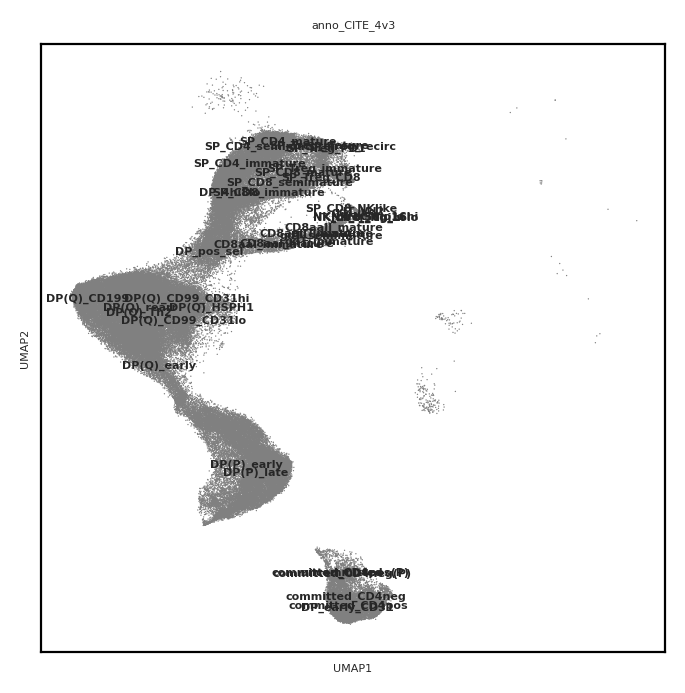

['CD8aaII_immature',
 'CD8aaII_mature',
 'CD8aaI_immature',
 'CD8aaI_mature',
 'DP(P)_early',
 'DP(P)_late',
 'DP(Q)_CD99_CD31hi',
 'DP(Q)_CD99_CD31lo',
 'DP(Q)_CD199',
 'DP(Q)_HSPH1',
 'DP(Q)_Th2',
 'DP(Q)_early',
 'DP(Q)_rearr',
 'DP_4hi8lo',
 'DP_early_CD31',
 'DP_pos_sel',
 'NK_circ_56hi16lo',
 'NK_circ_56lo16hi',
 'NK_tr_itg_hi',
 'NK_tr_itg_lo',
 'SP_CD4_immature',
 'SP_CD4_mature',
 'SP_CD4_semimature',
 'SP_CD8_NKlike',
 'SP_CD8_immature',
 'SP_CD8_mature',
 'SP_CD8_semimature',
 'SP_Treg_CD8',
 'SP_Treg_PD1',
 'SP_Treg_immature',
 'SP_Treg_mature',
 'SP_Treg_recirc',
 'committed_CD4neg',
 'committed_CD4neg(P)',
 'committed_CD4pos',
 'committed_CD4pos(P)',
 'gdT_Vd2',
 'gdT_immature',
 'gdT_mature',
 'gdT_semimature',
 'iNKT',
 'uncommitted']

In [122]:
plt.rcParams["figure.figsize"] = [20,20]
plt.rcParams['font.family'] = 'sans-serif'
sc.set_figure_params(fontsize=4,dpi=100)
sc.pl.umap(adata_abtcr, color=['anno_CITE_4v3'],legend_loc='on data')
list(adata_abtcr.obs.anno_CITE_4v3.cat.categories)

## Subset cells to dp onwards, and cells with paired TCRab

In [14]:
ct_order = ['DP(P)_early','DP(P)_late','DP(Q)_early','DP(Q)_CD99_CD31lo',
            'DP(Q)_Th2','DP(Q)_HSPH1','DP(Q)_rearr','DP(Q)_CD199','DP(Q)_CD99_CD31hi',
            'DP_pos_sel', 'DP_4hi8lo','SP_CD4_immature','SP_CD4_semimature','SP_CD4_mature',
            'SP_Treg_immature','SP_Treg_mature','SP_Treg_CD8','SP_Treg_PD1','SP_Treg_recirc']
anno = 'anno_CITE_4v3'
 
ct_color_map = dict(zip(ct_order, np.array(sns.color_palette("husl", len(ct_order)))[range(len(ct_order))]))


# subset cells to celltypes within ct_order
bdata = adata_abtcr[adata_abtcr.obs[anno].isin(ct_order)]
# filter out cells without any contig
for chain in ['v_call_abT_VDJ_main', 'j_call_abT_VDJ_main','v_call_abT_VJ_main', 'j_call_abT_VJ_main']:
    bdata.obs[chain] = bdata.obs[chain].astype('str')
# change all entries with ',' (inconfident mappings) to 'None'
for cell in bdata.obs_names:
    for chain in ['v_call_abT_VDJ_main', 'j_call_abT_VDJ_main','v_call_abT_VJ_main', 'j_call_abT_VJ_main']:
        gene = bdata.obs.loc[cell, chain]
        if ',' in gene or gene =='None' or gene =='' or gene=='No_contig':
            bdata.obs.loc[cell, chain] = chain+'_None'

/tmp/ipykernel_63688/3809311145.py:14: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.


In [15]:
# option for DP onwards - only leave cells with all 4 chains
bdata = bdata[~(np.array(bdata.obs['v_call_abT_VDJ_main'].str.endswith('None')) | np.array(bdata.obs['j_call_abT_VDJ_main'].str.endswith('None')) |
np.array(bdata.obs['v_call_abT_VJ_main'].str.endswith('None')) | np.array(bdata.obs['j_call_abT_VJ_main'].str.endswith('None')))]

In [16]:
bdata

View of AnnData object with n_obs × n_vars = 50648 × 36751
    obs: 'n_genes', 'batch', 'chemistry', 'age_group', 'age_numeric', 'sampleID_TCRab', 'path_TCRab', 'type', 'study', 'sample', 'enrichment', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'barcode_sequence', 'louvian_1', 'louvian_05', 'latent_cell_probability', 'latent_RT_efficiency', 'log1p_n_counts', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_m

/nfs/team205/ny1/miniconda/miniconda3/envs/dandemilo-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


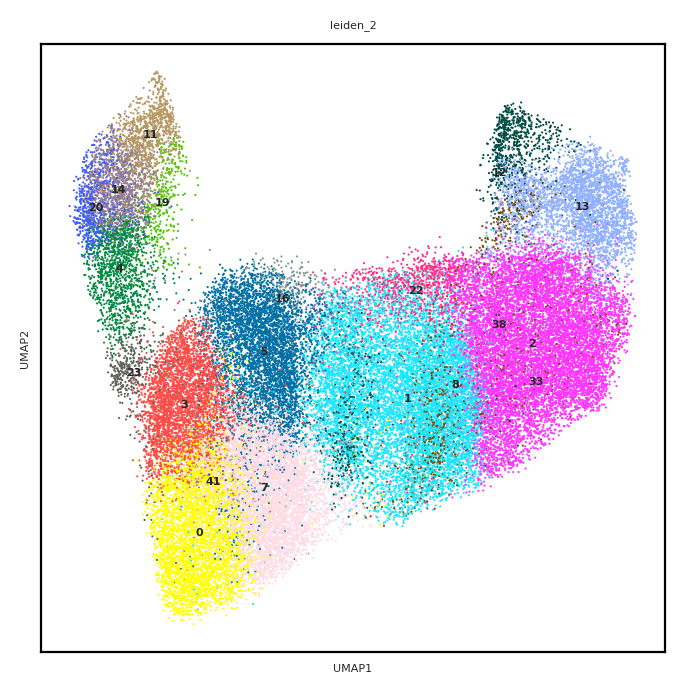

In [123]:
sc.pl.umap(bdata, color='leiden_2',legend_loc='on data')

/nfs/team205/ny1/miniconda/miniconda3/envs/dandemilo-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


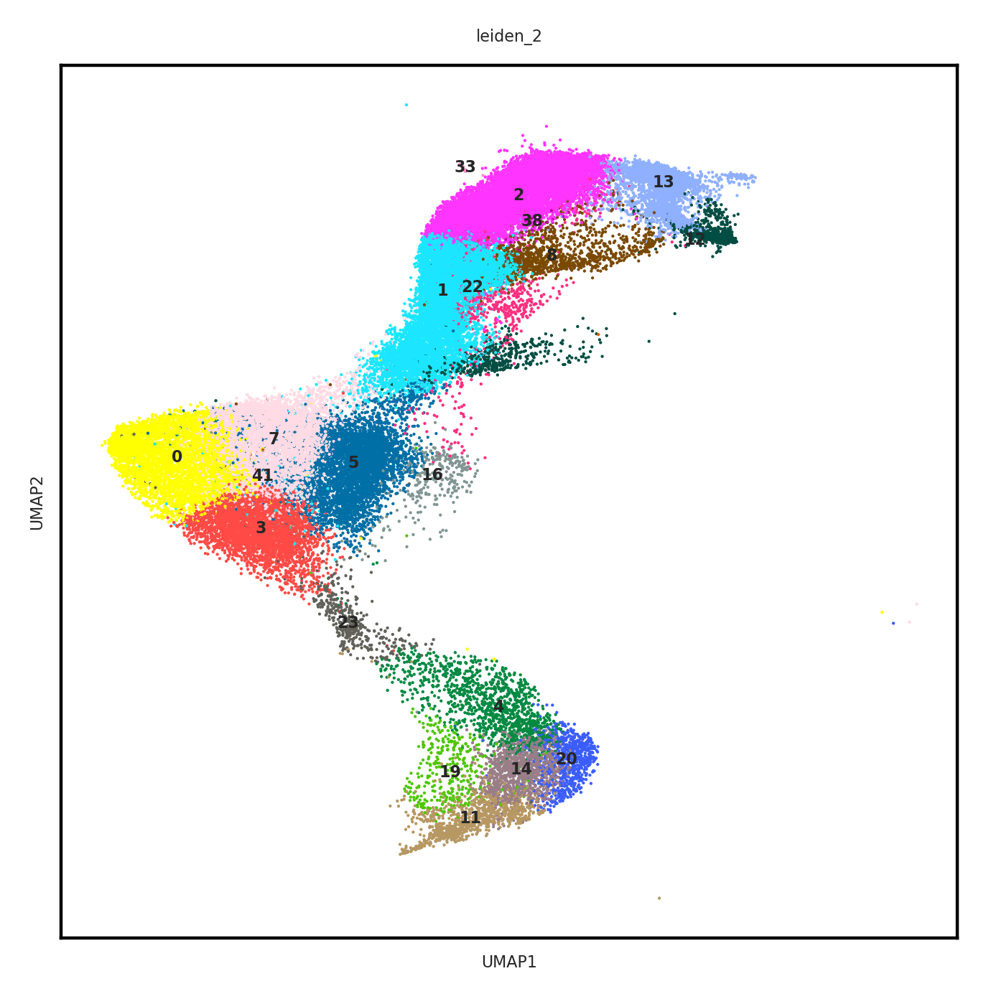

In [18]:
bdata = bdata[~bdata.obs['leiden_2'].isin(['18','10','15','6','17','25','27','31','9','26','21'])]
sc.pl.umap(bdata, color='leiden_2',legend_loc='on data')

# Select neighbourhoods 

In [19]:
## need to redo neighborhood graph after subsetting cells before milo
# n_neighbors decides the minimum neighbourhood size 
# here use_rep = 'X_scvi' as data integration was done using scVI
sc.pp.neighbors(bdata, use_rep = "X_scVI", n_neighbors = 100)
sc.tl.umap(bdata, random_state = 1712)

/nfs/team205/ny1/miniconda/miniconda3/envs/dandemilo-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


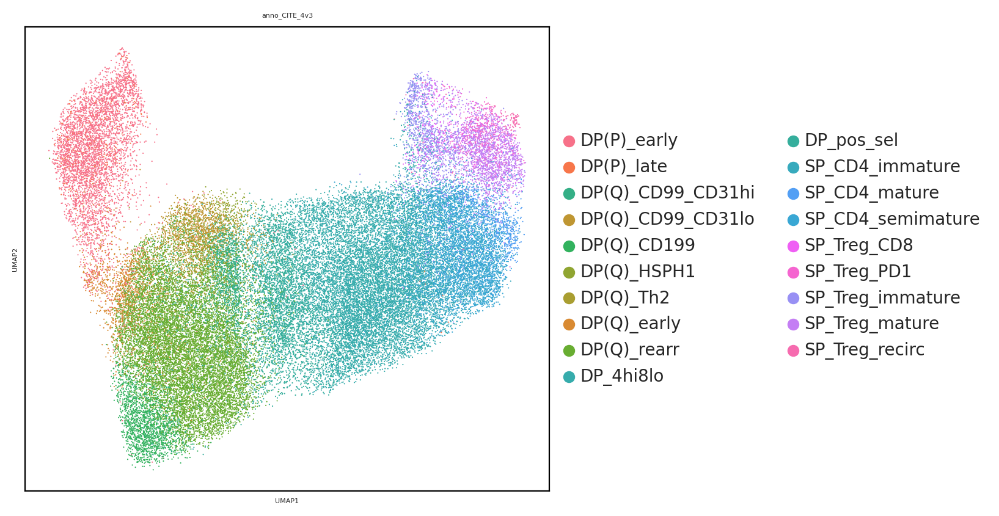

In [124]:
# take a look at the UMAP to make sure it looks reasonable i.e. different cell types are clustered separately
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = [5.5,5]
sc.pl.umap(bdata, color=[anno], palette = ct_color_map, legend_loc = 'right margin', legend_fontsize=10)

In [22]:
import milopy
import milopy.core as milo

# use milo to sample neighbourhood
milo.make_nhoods(bdata)
# build neighbourhood adata in bdata.uns['nhood_adata']
milo.count_nhoods(bdata, sample_col='sample') # this step is needed to build bdata.uns['nhood_adata'] and sample_col can be anything
# this step is needed for plotting below
milopy.utils.build_nhood_graph(bdata)
# assign neighbourhood celltype by majority voting
# results are in bdata.uns['nhood_adata'].obs['nhood_annotation'] & bdata.uns['nhood_adata'].obs['nhood_annotation_frac'] 
milopy.utils.annotate_nhoods(bdata, anno_col=anno)
bdata

/nfs/team205/ny1/miniconda/miniconda3/envs/dandemilo-env/lib/python3.9/site-packages/anndata/_core/anndata.py:117: ImplicitModificationWarning: Transforming to str index.


AnnData object with n_obs × n_vars = 50369 × 36751
    obs: 'n_genes', 'batch', 'chemistry', 'age_group', 'age_numeric', 'sampleID_TCRab', 'path_TCRab', 'type', 'study', 'sample', 'enrichment', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'barcode_sequence', 'louvian_1', 'louvian_05', 'latent_cell_probability', 'latent_RT_efficiency', 'log1p_n_counts', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spli

Now neighbourhood adata is stored in bdata.uns['nhood_adata']

# Create neighbourhood VDJ feature space

In [24]:
#### this option for DP
# function for making neighbourhood vdj feature space
nhood_adata = ddl.tl.vdj_pseudobulk(bdata, pbs = bdata.obsm['nhoods'], obs_to_take = anno, extract_cols=['v_call_abT_VDJ_main', 'j_call_abT_VDJ_main','v_call_abT_VJ_main', 'j_call_abT_VJ_main'])
nhood_adata

/nfs/team205/ny1/miniconda/miniconda3/envs/dandemilo-env/lib/python3.9/site-packages/anndata/_core/anndata.py:117: ImplicitModificationWarning: Transforming to str index.


AnnData object with n_obs × n_vars = 3107 × 164
    obs: 'anno_CITE_4v3', 'anno_CITE_4v3_fraction', 'cell_count'
    obsm: 'pbs'

     nhood_adata is the new neighbourhood VDJ feature space, whereby each observation is a cell neighbourhood
     VDJ usage frequency stored in nhood_adata.X
     VDJ genes stored in nhood_adata.var
     neighbourhood metadata stored in nhood_adata.obs
     can visualise the data using PCA or UMAP (see below)

In [27]:
# # sort out the annotation colour order
# # sort out the annotation colour order
ct_order_nhood = [value for value in ct_order if value in list(np.unique(nhood_adata.obs['anno_CITE_4v3']))]
ct_color_map_nhood = dict(zip(ct_order_nhood, np.array(sns.color_palette("tab10", len(ct_order_nhood)))[range(len(ct_order_nhood))]))
ct_order_nhood
nhood_adata.obs[anno] = nhood_adata.obs[anno].astype('category')
nhood_adata.obs[anno] = nhood_adata.obs[anno].cat.reorder_categories(ct_order_nhood)

/nfs/team205/ny1/miniconda/miniconda3/envs/dandemilo-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


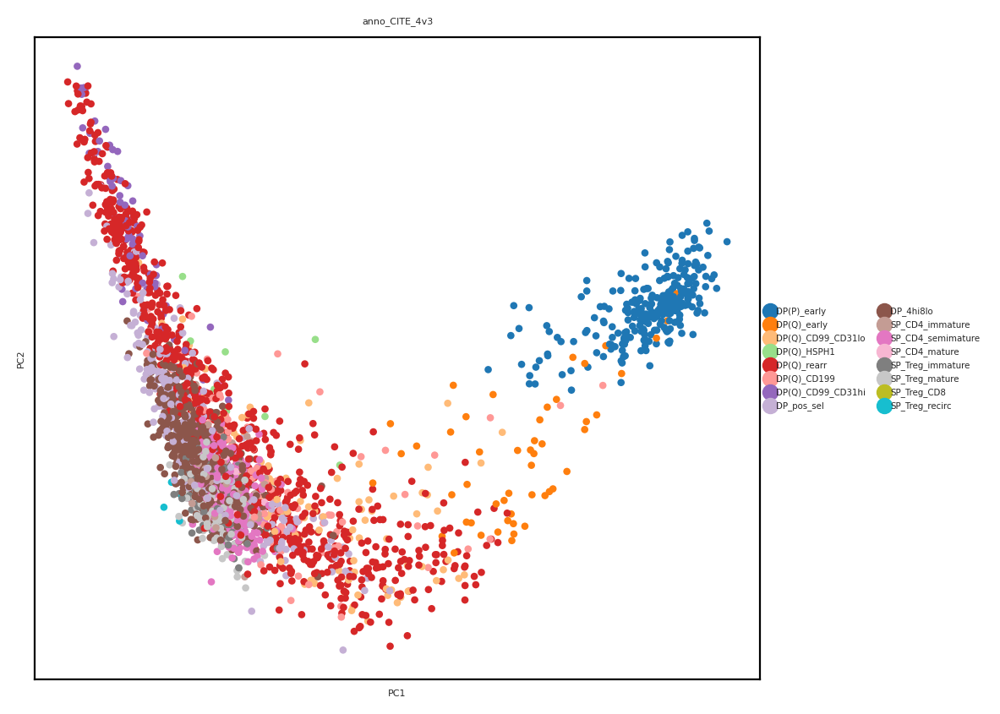

In [125]:
sc.pp.pca(nhood_adata, random_state = 1712)
sc.pl.pca(nhood_adata, color=[anno], palette=ct_color_map_nhood)

/nfs/team205/ny1/miniconda/miniconda3/envs/dandemilo-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


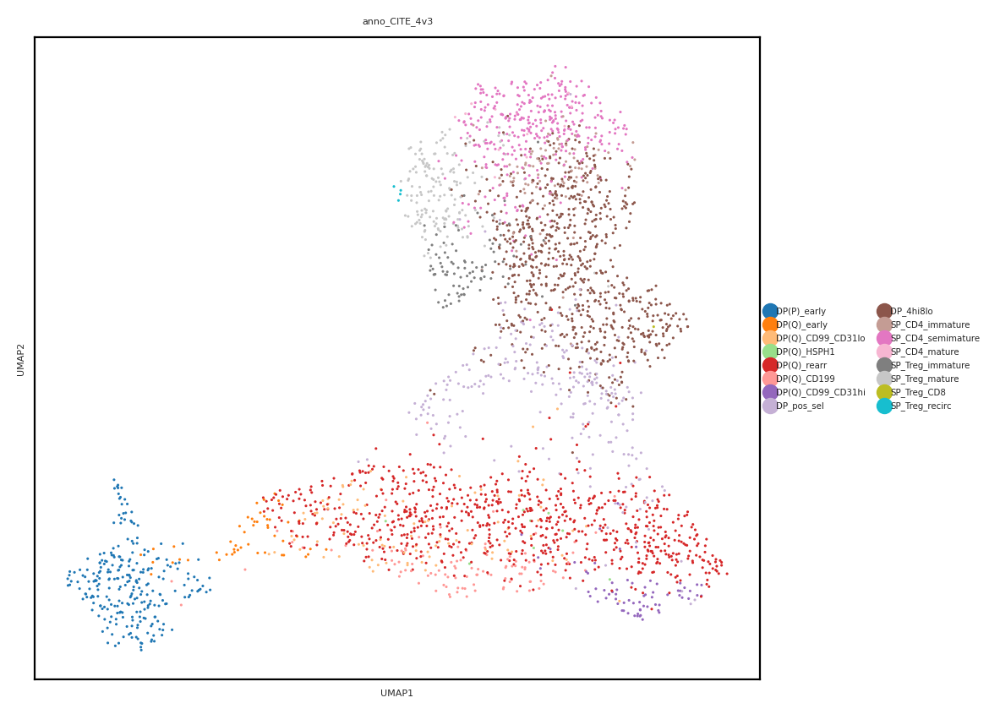

In [126]:
sc.pp.neighbors(nhood_adata, random_state = 1712)
sc.tl.umap(nhood_adata, random_state = 1712)
sc.pl.umap(nhood_adata, color=[anno],s=5)

## Run Pseudotime on VDJ feature space

In [72]:
# make sure you install palantir if you don't already have it

# Run diffusion maps
pca_projections = pd.DataFrame(nhood_adata.obsm['X_pca'], index=nhood_adata.obs_names)
dm_res = palantir.utils.run_diffusion_maps(pca_projections, n_components=10)
dm_res

Determing nearest neighbor graph...


{'T': <3107x3107 sparse matrix of type '<class 'numpy.float64'>'
 	with 145056 stored elements in Compressed Sparse Row format>,
 'EigenVectors':             0         1         2         3         4         5         6  \
 0    -0.01794 -0.057031 -0.009538  0.007307  0.004701  0.000984  0.001390   
 1    -0.01794 -0.057475 -0.010035  0.007829  0.006007  0.001662  0.003128   
 2    -0.01794 -0.057738 -0.010336  0.008149  0.006854  0.002101  0.004218   
 3    -0.01794 -0.054573 -0.006810  0.004442 -0.002526 -0.002990 -0.009537   
 4    -0.01794 -0.050605 -0.002620  0.000128 -0.011728 -0.007253 -0.020163   
 ...       ...       ...       ...       ...       ...       ...       ...   
 3102 -0.01794  0.006938  0.023916  0.054705 -0.039322  0.030170  0.044169   
 3103 -0.01794  0.006928  0.011804  0.032374 -0.013458 -0.009609  0.009490   
 3104 -0.01794 -0.001408  0.031214 -0.029425 -0.006381  0.009394  0.031364   
 3105 -0.01794  0.005386  0.011675  0.003949  0.027687 -0.004875 -0.027093 

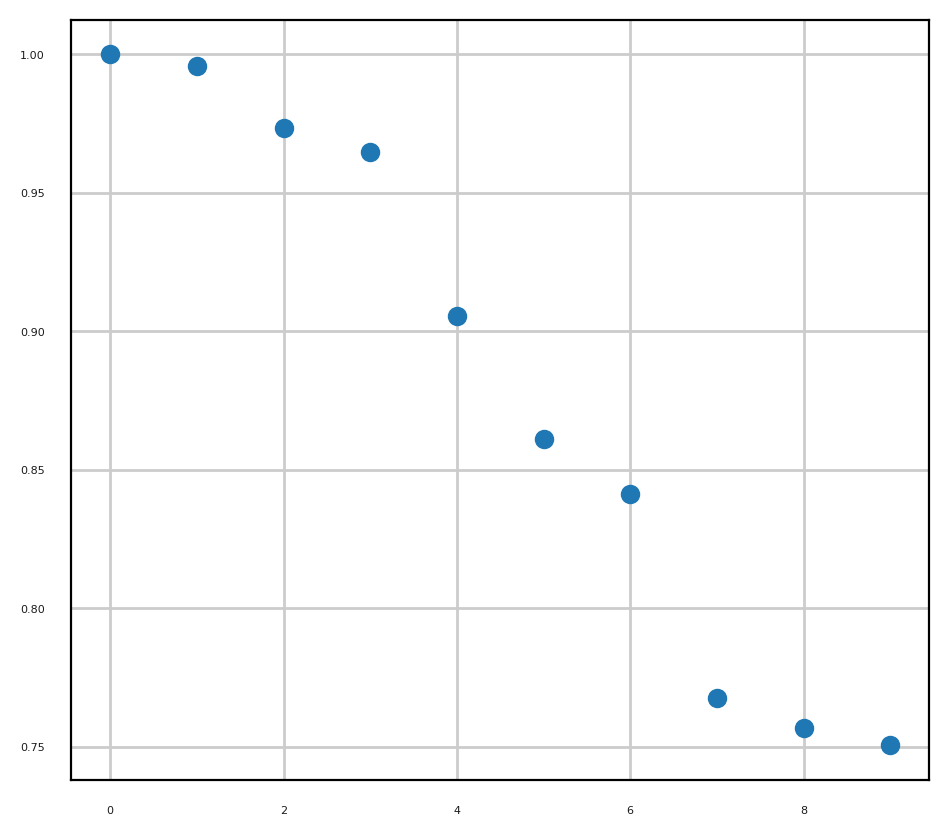

In [127]:
plt.scatter(np.arange(10), dm_res['EigenValues'])

In [74]:
# based on plot above, choose n_eigs
ms_data = palantir.utils.determine_multiscale_space(dm_res, n_eigs=7)

In [75]:
# for DN only
#plt.rcParams["figure.figsize"] = [4,4]
#sc.pl.umap(nhood_adata, color=[col + '_None' for col in cols],color_map = 'RdYlBu_r')

In [76]:
# select the start and end points
# start
tmp = nhood_adata[nhood_adata.obs[anno] == 'DP(P)_early']
#tmp = nhood_adata[nhood_adata.obs['mapping_anno_v3'] == 'DN(early)']
rootcell = np.argmax(tmp.obsm['X_umap'][:,1])
rootcell = tmp.obs_names[rootcell]
nhood_adata.obs['rootcell'] = 0
nhood_adata.obs.loc[rootcell,'rootcell'] = 1

In [88]:
# ends
tmp1 = nhood_adata[nhood_adata.obs[anno] == 'SP_Treg_mature',]
tmp2 = nhood_adata[nhood_adata.obs[anno] == 'SP_CD4_mature']
tmp3 = nhood_adata[nhood_adata.obs[anno] == 'SP_Treg_CD8']

endcell1 = np.argmin(tmp1.obsm['X_umap'][0,:])
endcell1 = tmp1.obs_names[endcell1]
endcell2 = np.argmin(tmp2.obsm['X_umap'][0,:])
endcell2 = tmp2.obs_names[endcell2]
endcell3 = np.argmax(tmp3.obsm['X_umap'][:,0])
endcell3 = tmp3.obs_names[endcell3]

terminal_states = pd.Series(['SP_Treg_mature', 'SP_CD4_mature','SP_Treg_CD8'], 
                           index=[endcell1,endcell2,endcell3])

/nfs/team205/ny1/miniconda/miniconda3/envs/dandemilo-env/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


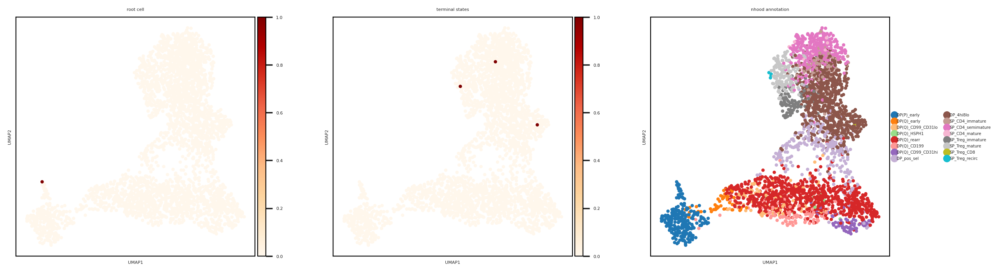

In [128]:
# plot rootcell and terminal states
nhood_adata.obs['terminal_states'] = 0
nhood_adata.obs.loc[terminal_states.index, 'terminal_states'] = 1
plt.rcParams["figure.figsize"] = [4,4]
sc.pl.umap(nhood_adata,color=['rootcell','terminal_states',anno],
           title=['root cell','terminal states','nhood annotation'],color_map='OrRd')

In [90]:
pr_res = palantir.core.run_palantir(ms_data,  rootcell, num_waypoints=500, 
                                    terminal_states = terminal_states.index)

Sampling and flocking waypoints...
Time for determining waypoints: 0.0031839569409688314 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor graph...


findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Lato'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Lato'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Lato'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Lato'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Lato'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Lato'] not found. Falling bac

Time for shortest paths: 0.19343992869059246 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 0.9999
Entropy and branch probabilities...
Markov chain construction...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...


In [91]:
pr_res.branch_probs.columns = terminal_states[pr_res.branch_probs.columns]

## Visualise the data

In [92]:
ddl.tl.pseudotime_transfer(adata = nhood_adata, pr_res = pr_res, suffix = '_nhood_vdj')

AnnData object with n_obs × n_vars = 3107 × 164
    obs: 'anno_CITE_4v3', 'anno_CITE_4v3_fraction', 'cell_count', 'rootcell', 'terminal_states', 'pseudotime_nhood_vdj', 'prob_SP_Treg_recirc_nhood_vdj', 'prob_SP_CD4_mature_nhood_vdj', 'prob_SP_Treg_CD8_nhood_vdj', 'prob_SP_Treg_mature_nhood_vdj'
    uns: 'pca', 'anno_CITE_4v3_colors', 'neighbors', 'umap'
    obsm: 'pbs', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

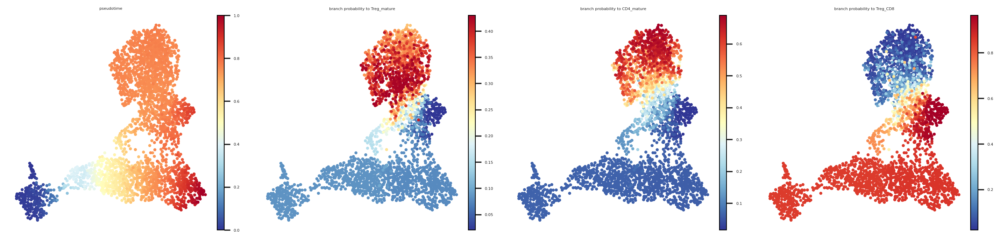

In [129]:
plt.rcParams["figure.figsize"] = [4,4]
plot = ['pseudotime', 'prob_SP_Treg_mature', 'prob_SP_CD4_mature','prob_SP_Treg_CD8']
sc.pl.umap(nhood_adata,color=[term + '_nhood_vdj' for term in plot],
           title=['pseudotime','branch probability to Treg_mature','branch probability to CD4_mature','branch probability to Treg_CD8'],
           frameon=False,wspace=0.1,
           color_map = 'RdYlBu_r'
          )

## Project pseudotime and branch probabilities back to cells

In [95]:
# project the nhood level pseudotime to cell level pseudotime.
cdata = ddl.tl.project_pseudotime_to_cell(adata = bdata, 
                               pb_adata = nhood_adata, 
                               term_states=['SP_Treg_mature', 'SP_CD4_mature','SP_Treg_CD8'], 
                               suffix = '_nhood_vdj')

number of cells removed due to not belonging to any neighbourhood 14


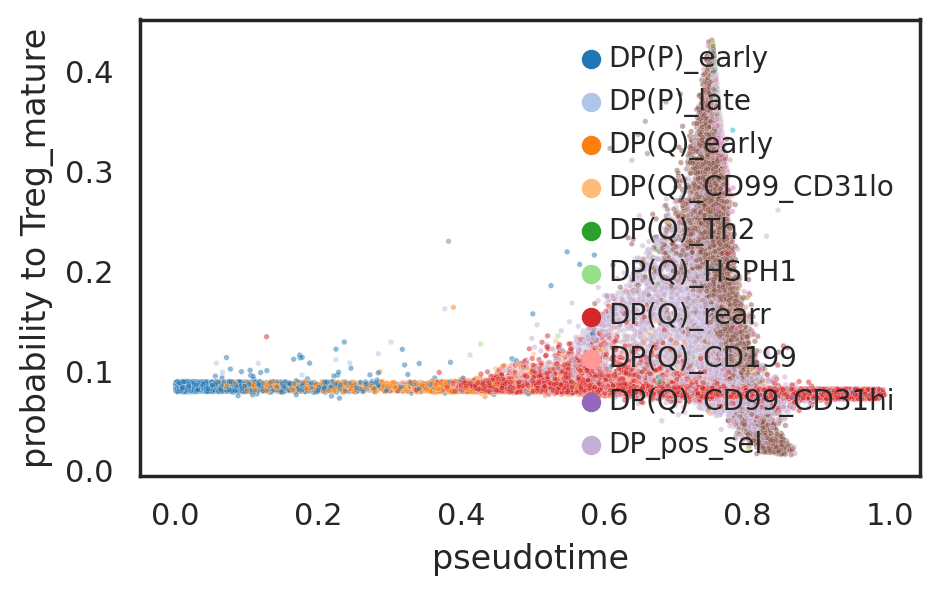

In [130]:
ct_order_nhood = [value for value in ct_order if value in list(np.unique(cdata.obs['anno_CITE_4v3']))]
ct_color_map_nhood = dict(zip(ct_order_nhood, np.array(sns.color_palette("tab20", len(ct_order_nhood)))[range(len(ct_order_nhood))]))
ct_order_nhood

sns.set_theme(style='white')
fig, ax = plt.subplots(figsize=(5,3))
cdata.obs[anno] = cdata.obs[anno].cat.reorder_categories(ct_order)
df = cdata.obs.copy()
sigma = 0.01
df['prob_SP_Treg_mature_nhood_vdj'] = df['prob_SP_Treg_mature_nhood_vdj'] + (np.random.rand(len(df['prob_SP_Treg_mature_nhood_vdj']))-0.5)*sigma
ax= sns.scatterplot(data=df, 
                    x ='pseudotime_nhood_vdj',
                    y='prob_SP_Treg_mature_nhood_vdj',
                    s=4,
                    hue=anno,
                    palette = ct_color_map_nhood,alpha=0.5)
ax.set_ylabel('probability to Treg_mature')    
ax.set_xlabel('pseudotime')
ax.set_title('')
h,l = ax.get_legend_handles_labels()
l1 = ax.legend(h[:10],l[:10], loc='upper right',bbox_to_anchor=(1, 1),frameon=False, fontsize='small')
# plt.savefig(fig_path+'/pseudotime_scatterplot_nhood_vdj.pdf',bbox_inches='tight')

In [150]:
cdata.obs[anno]

barcode
F64_TH_TOT_5GEX_1-CCTTTCTAGCGAGAAA         T_DP(P)
F64_TH_TOT_5GEX_1-CAGTAACAGCACAGGT         T_DP(P)
F64_TH_TOT_5GEX_1-GACGCGTAGAACAACT         T_DP(P)
F64_TH_TOT_5GEX_1-GGATTACGTGTCCTCT         T_DP(P)
F64_TH_TOT_5GEX_1-CGCTTCAAGCGATAGC         T_DP(P)
                                          ...     
TA13072427-CAGAGAGTCGTGACAT                  T_CD4
TA13072427-ATGAGGGCAGTCGTGC                T_DP(Q)
TA13072427-CTACGTCCACCCATGG                T_DP(Q)
TA13072427-CGTCACTTCTCGAGTA                T_DP(Q)
TA13072427-CGTAGCGGTGTGTGCC           T_αβT(entry)
Name: annotation_level_3, Length: 44672, dtype: category
Categories (8, object): ['T_DP(P)', 'T_DP(Q)-early', 'T_DP(Q)', 'T_DP(Q)-HSPH1', 'T_DP(Q)-CD99', 'T_αβT(entry)', 'T_CD4', 'T_CD8']

/tmp/ipykernel_63688/809370417.py:4: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
/tmp/ipykernel_63688/809370417.py:18: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.


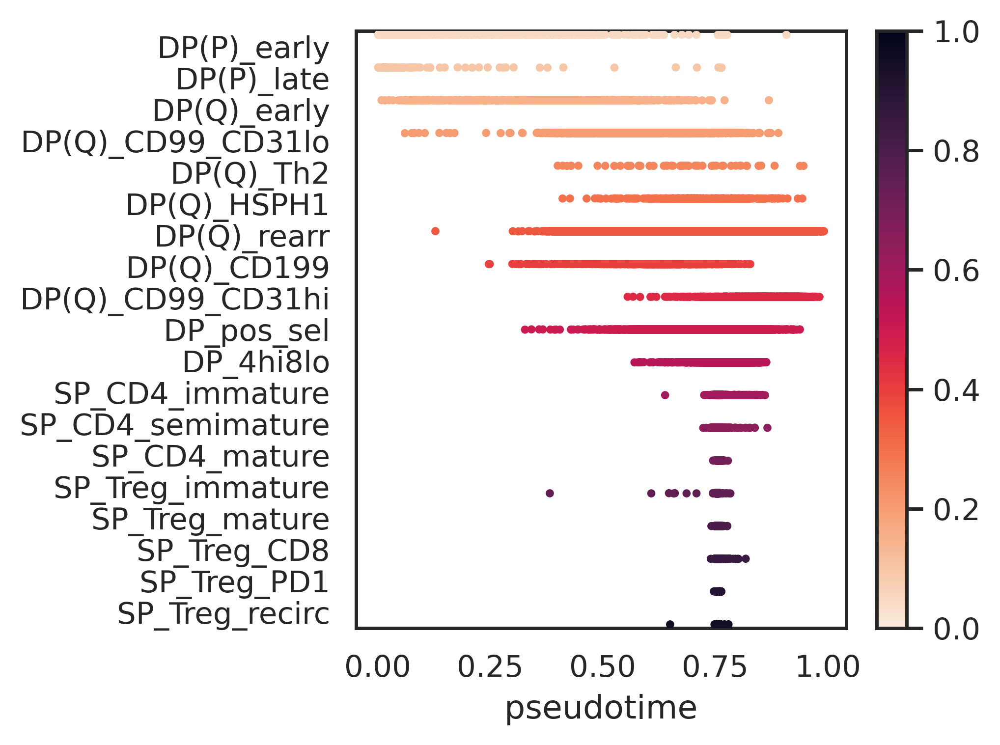

In [120]:
fig, ax = plt.subplots(figsize=(4,4))
# # sort out the annotation colour order
tmp_cdata = cdata[cdata.obs['anno_CITE_4v3'].isin(ct_order)] 
tmp_cdata.obs['anno_CITE_4v3'] = tmp_cdata.obs['anno_CITE_4v3'].astype('category')
tmp_cdata.obs['anno_CITE_4v3'] = tmp_cdata.obs['anno_CITE_4v3'].cat.reorder_categories(ct_order)
# plot color bar
norm = plt.Normalize(0, 1)
sm = plt.cm.ScalarMappable(cmap="rocket_r", norm=norm)
sm.set_array([])


ax=sns.stripplot(data=tmp_cdata.obs, x="pseudotime_nhood_vdj", hue='anno_CITE_4v3', y='anno_CITE_4v3',
                   palette='rocket_r',dodge=True, size=3)
ax.set_ylabel('')    
ax.set_xlabel('pseudotime')
ax.set_title('')
ax.get_legend().remove()
ax.figure.colorbar(sm)

In [105]:
# load TCR list by location - lists in github folder metadata/TCR_genes
TCR_list_by_loc_dict = {}
for chain in ['TRAV','TRAJ']:
    path = '/lustre/scratch126/cellgen/team205/cs42/VDJ_collab_manuscript/gene_list/'+chain+'_list_by_location.csv'
    TCR_list_by_loc_dict[chain] = list(pd.read_csv(path, header=None)[0])

In [107]:
# look at TRAV/TRAJ expression 
bulk_adata = ddl.tl.vdj_pseudobulk(adata = cdata, obs_to_bulk = [anno], obs_to_take = [anno],
                                   extract_cols= ['v_call_abT_VDJ_main', 'j_call_abT_VDJ_main','v_call_abT_VJ_main', 'j_call_abT_VJ_main'])

/nfs/team205/ny1/miniconda/miniconda3/envs/dandemilo-env/lib/python3.9/site-packages/anndata/_core/anndata.py:117: ImplicitModificationWarning: Transforming to str index.


In [108]:
gene_intersection = [gene for gene in TCR_list_by_loc_dict['TRAV'] if gene in bulk_adata.var_names] +[gene for gene in TCR_list_by_loc_dict['TRAJ'] if gene in bulk_adata.var_names] 
trav = pd.DataFrame(index = bulk_adata.obs[anno], columns = gene_intersection,
                    data = bulk_adata[:,gene_intersection].X)
trav = trav

In [109]:
# trav = trav.reindex(['T_DP(P)','T_DP(Q)-early','T_alpha_vj_init','T_alpha_vj_inter','T_alpha_vj_adv','T_alpha_vj_late','T_DP(Q)-HSPH1','T_DP(Q)-CD99','T_αβT(entry)','T_αβT(entry)_CD4','T_αβT(entry)_CD8', 'T_CD4','T_CD8'])
# trav = trav.reindex(['T_DP(P)','T_DP(Q)-early', 'T_DP(Q)', 'T_DP(Q)-HSPH1','T_DP(Q)-CD99','T_DP_late','T_αβT(entry)','T_αβT(entry)_CD4', 'T_CD4','T_αβT(entry)_CD8','T_CD8'])

In [28]:
fig_path

'/nfs/team205/ny1/ThymusSpatialAtlas/Figure3/VDJ/figures'

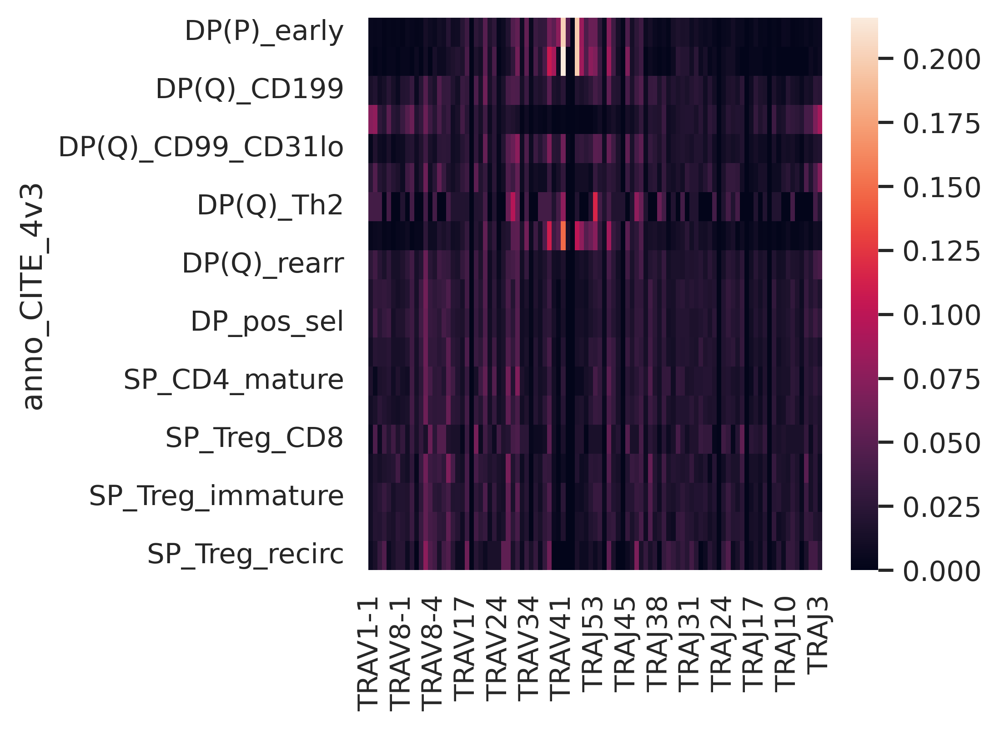

In [119]:
plt.rcParams["figure.figsize"] = [4,4]
svm = sns.heatmap(trav)
figure = svm.get_figure()    
# figure.savefig(fig_path+'/vdj_usage.pdf', dpi=200)
# pseudotime_scatterplot_nhood_vdj.pdf',bbox_inches='tight'
# DP_late is using the end of TRAV/TRAJv


In [111]:
plot = ['pseudotime', 'prob_SP_Treg_mature', 'prob_SP_CD4_mature','prob_SP_Treg_CD8']
[term + '_nhood_vdj' for term in plot]

['pseudotime_nhood_vdj',
 'prob_SP_Treg_mature_nhood_vdj',
 'prob_SP_CD4_mature_nhood_vdj',
 'prob_SP_Treg_CD8_nhood_vdj']

In [114]:
adata_full.obs['pseudotime_nhood_agonist_vdj'] = cdata.obs['pseudotime_nhood_vdj']
adata_full.obs['prob_SP_Treg_mature_agonist_nhood_vdj'] = cdata.obs['prob_SP_Treg_mature_nhood_vdj']
adata_full.obs['prob_SP_CD4_mature_agonist_nhood_vdj'] = cdata.obs['prob_SP_CD4_mature_nhood_vdj']
adata_full.obs['prob_SP_Treg_CD8_agonist_nhood_vdj'] = cdata.obs['prob_SP_Treg_CD8_nhood_vdj']

In [115]:
adata_full.write_h5ad('/nfs/team205/ny1/ThymusSpatialAtlas/Figure5/Thymus_Atlas_v20_CITE.h5ad')

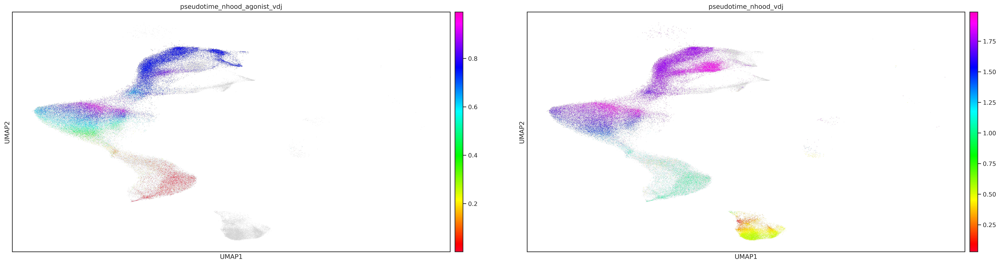

In [118]:
sc.pl.umap(adata_full, 
           color=['pseudotime_nhood_agonist_vdj','pseudotime_nhood_vdj'],
           color_map = 'gist_rainbow')